# Imports

In [1]:
import pandas as pd
import numpy as np
from tabulate import tabulate

from CortesAnalysisPackage import plot as pt
from CortesAnalysisPackage import peakfitting as pfa
from CortesAnalysisPackage import componentfitting as ca
from CortesAnalysisPackage import classical as cla
from CortesAnalysisPackage import svd as svd
# Import
import pandas as pd
import numpy as np
import INS_Analysis as insd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats.mstats import linregress

2025-07-25 13:21:51.991658: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-25 13:21:52.001095: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1753467712.010188 1286807 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1753467712.012949 1286807 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-25 13:21:52.024283: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instr

In [2]:
import warnings

In [3]:
from CortesAnalysisPackage import ml as ml

# Data

In [4]:
df = pd.read_pickle("../Data/DetectorReadings.pkl")
bins = df['bins'].values
df = df.drop(columns=['bins'])
df.index = bins
exp_df = pd.read_pickle('../Data/ExpirementData.pkl')

In [5]:
# exp_df = exp_df[['filename', 'avg_carbon_portion', 'function','elem_maps']]
exp_df = exp_df.set_index('filename')

In [6]:
material_names = ['Silica', 'Kaolinite', 'Smectite', 'Montmorillonite', 'Quartz', 'Chlorite', 'Mica', 'Feldspar', 'Coconut']

In [7]:
material_mixes_exp_df = exp_df[exp_df.index.str.contains('|'.join(material_names), case=False)]
material_mixes_df = df[material_mixes_exp_df.index]
material_mixes_df.index = bins

In [8]:
elem_names = ['Si', 'Al', 'H', 'Na', 'O', 'Fe', 'Mg', 'C']
elem_exp_df = exp_df[exp_df['function'].isin(elem_names)]
elem_df = df[elem_exp_df.index]
elem_df.index = bins

In [9]:
elem_exp_df

,soil_resolution,function,id,avg_carbon_portion,spectrum_bins,spectrum_tally,elem_maps,avg_densities
filename,,,,,,,,
7x7x7_Si_001000,7x7x7,Si,1000,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000840412, 6.85e-07, 0.000600802, 0.0004206...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",2.33000
7x7x7_Al_001001,7x7x7,Al,1001,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00106409, 8.95e-07, 0.0007947, 0.000577543,...","[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",2.70000
7x7x7_H_001002,7x7x7,H,1002,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[1.4694e-05, 1.1e-08, 1.1009e-05, 7.965e-06, 3...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.00100
7x7x7_Na_001003,7x7x7,Na,1003,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00075968, 6.04e-07, 0.000541638, 0.00038162...","[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",0.97000
7x7x7_O_001004,7x7x7,O,1004,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[1.5841e-05, 1.1e-08, 1.1767e-05, 8.406e-06, 4...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]",0.00143
7x7x7_Fe_001005,7x7x7,Fe,1005,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00164398, 1.489e-06, 0.00133006, 0.00104729...","[0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0]",7.87000
7x7x7_Mg_001006,7x7x7,Mg,1006,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000912043, 7.63e-07, 0.000653511, 0.0004585...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]",1.74000
7x7x7_C_001007,7x7x7,C,1007,1.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000854398, 6.88e-07, 0.000617626, 0.0004379...","[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]",2.33000


In [10]:
exp_df

,soil_resolution,function,id,avg_carbon_portion,spectrum_bins,spectrum_tally,elem_maps,avg_densities
filename,,,,,,,,
7x7x7_Si_001000,7x7x7,Si,1000,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000840412, 6.85e-07, 0.000600802, 0.0004206...","[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",2.33000
7x7x7_Al_001001,7x7x7,Al,1001,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00106409, 8.95e-07, 0.0007947, 0.000577543,...","[0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",2.70000
7x7x7_H_001002,7x7x7,H,1002,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[1.4694e-05, 1.1e-08, 1.1009e-05, 7.965e-06, 3...","[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.00100
7x7x7_Na_001003,7x7x7,Na,1003,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00075968, 6.04e-07, 0.000541638, 0.00038162...","[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0]",0.97000
7x7x7_O_001004,7x7x7,O,1004,0.0,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[1.5841e-05, 1.1e-08, 1.1767e-05, 8.406e-06, 4...","[0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]",0.00143
...,...,...,...,...,...,...,...,...
7x7x7_C_5000_Feldspar_Fill_003147,7x7x7,C_5000_Feldspar_Fill,3147,0.5,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000796501, 6.16e-07, 0.000568609, 0.0003991...","[0.15892848226619807, 0.08468110812564669, 0.0...",1.54000
7x7x7_C_6000_Feldspar_Fill_003148,7x7x7,C_6000_Feldspar_Fill,3148,0.6,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000768021, 6.46e-07, 0.000550425, 0.0003856...","[0.12714278581295765, 0.06774488650051685, 0.0...",1.33800
7x7x7_C_7000_Feldspar_Fill_003149,7x7x7,C_7000_Feldspar_Fill,3149,0.7,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000730229, 6e-07, 0.000521664, 0.000366989,...","[0.0953570893597193, 0.050808664875387946, 0.0...",1.13600


In [11]:
convolution_df = pd.read_pickle('../ConvolutedData/ConvolutionData.pkl')
convolution_exp_df = pd.read_pickle('../ConvolutedData/ConvolutionExpData.pkl')

In [12]:
convolution_exp_df = convolution_exp_df.set_index('filename')

In [13]:
convolution_exp_df

,avg_carbon_portion,elem_maps
filename,,
lin_conv_Silica_C0,0.000,"[0.5566365871108506, 0.1949238586681888, 0.0, ..."
lin_conv_Silica_C005999999999999998,0.006,"[0.5566213041327935, 0.1949185068513595, 0.0, ..."
lin_conv_Silica_C011999999999999997,0.012,"[0.5565747182192218, 0.19490219332428796, 0.0,..."
lin_conv_Silica_C017999999999999867,0.018,"[0.556495705834289, 0.1948745246454584, 0.0, 0..."
lin_conv_Silica_C023999999999999994,0.024,"[0.5563831196142159, 0.19483509902925292, 0.0,..."
...,...,...
lin_conv_Feldspar_C5999999999999964,0.600,"[0.19552892928394083, 0.10418275041882939, 0.0..."
lin_conv_Feldspar_C6999999999999957,0.700,"[0.13156275840895867, 0.07009995949922991, 0.0..."
lin_conv_Feldspar_C800000000000005,0.800,"[0.0785067512233736, 0.041830379263307634, 0.0..."


# Methods

## Supplementary Code for Peak Fitting and Component Analysis

In [14]:
def lev_filter(df, exp_df, min, max):
    """
    Filters the DataFrame based on the average carbon portion in exp_df.
    """
    filtered_exp_df = exp_df[(exp_df['avg_carbon_portion'] >= min) & (exp_df['avg_carbon_portion'] <= max)]
    filtered_df = df[filtered_exp_df.index]
    return filtered_df, filtered_exp_df



def edge_split_train(df, exp_df):
    """
    Splits the DataFrame into training and testing sets with edge cases min and max carbon levels.
    """
    min_carbon = exp_df['avg_carbon_portion'].min()
    max_carbon = exp_df['avg_carbon_portion'].max()

    train_exp_df = exp_df[(exp_df['avg_carbon_portion'] == min_carbon) | (exp_df['avg_carbon_portion'] == max_carbon)]
    train_df = df[train_exp_df.index]

    return train_df, train_exp_df

def edge_split_test(df, exp_df):
    """
    Splits the DataFrame into inner training and testing sets with edge cases min and max carbon levels.
    """
    min_carbon = exp_df['avg_carbon_portion'].min()
    max_carbon = exp_df['avg_carbon_portion'].max()

    test_exp_df = exp_df[(exp_df['avg_carbon_portion'] > min_carbon) & (exp_df['avg_carbon_portion'] < max_carbon)]
    test_df = df[test_exp_df.index]

    return test_df, test_exp_df


In [15]:
def edge_split_train_avg(df, exp_df):
    """
    Splits the DataFrame into training and testing sets with edge cases min and max carbon levels.
    """

    train_exp_df = pd.DataFrame(columns=['filename', 'avg_carbon_portion'])
    train_df = pd.DataFrame()
    
    min_carbon = exp_df['avg_carbon_portion'].min()
    max_carbon = exp_df['avg_carbon_portion'].max()

    min_train_exp_df = exp_df[exp_df['avg_carbon_portion'] == min_carbon]
    min_train_df = df[min_train_exp_df.index]

    avg_min_carbon = min_train_exp_df['avg_carbon_portion'].mean()
    avg_min_carbon_filename = "average_min_carbon"
    
    train_exp_df = pd.concat([train_exp_df, pd.DataFrame([{'filename': avg_min_carbon_filename, 'avg_carbon_portion': avg_min_carbon}])], ignore_index=True)
    
    avg_min_carbon_spec = min_train_df.mean(axis=1)
    train_df = pd.concat([train_df, pd.DataFrame(avg_min_carbon_spec, columns=["average_min_carbon"])], axis=1)
    max_train_exp_df = exp_df[exp_df['avg_carbon_portion'] == max_carbon]
    max_train_df = df[max_train_exp_df.index]

    avg_max_carbon = max_train_exp_df['avg_carbon_portion'].mean()
    avg_max_carbon_filename = "average_max_carbon"
    train_exp_df = pd.concat([train_exp_df, pd.DataFrame([{'filename': avg_max_carbon_filename, 'avg_carbon_portion': avg_max_carbon}])], ignore_index=True)
    train_exp_df = train_exp_df.set_index('filename')
    avg_max_carbon_spec = max_train_df.mean(axis=1)
    
    train_df = pd.concat([train_df, pd.DataFrame(avg_max_carbon_spec, columns=["average_max_carbon"])], axis=1)
    
    return train_df, train_exp_df


In [16]:
just_feldspar_df = material_mixes_df.filter(like='Feldspar', axis=1)
just_feldspar_exp_df = material_mixes_exp_df.loc[just_feldspar_df.columns]

In [17]:
just_feldspar_exp_df

,soil_resolution,function,id,avg_carbon_portion,spectrum_bins,spectrum_tally,elem_maps,avg_densities
7x7x7_Feldspar_001021,7x7x7,Feldspar,1021,0.000,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000880308, 7.44e-07, 0.00062299, 0.00043319...","[0.31785696453239615, 0.16936221625129338, 0.0...",2.55000
7x7x7_C_0060_Feldspar_Fill_003133,7x7x7,C_0060_Feldspar_Fill,3133,0.006,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000879007, 7.44e-07, 0.000622105, 0.0004328...","[0.3159498227452004, 0.16834604295378558, 0.0,...",2.53788
7x7x7_C_0120_Feldspar_Fill_003134,7x7x7,C_0120_Feldspar_Fill,3134,0.012,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000878468, 7.34e-07, 0.000621159, 0.0004324...","[0.3140426809580097, 0.16732986965627777, 0.0,...",2.52576
7x7x7_C_0180_Feldspar_Fill_003135,7x7x7,C_0180_Feldspar_Fill,3135,0.018,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000877433, 7.37e-07, 0.00062099, 0.00043223...","[0.31213553917081177, 0.16631369635877, 0.0, 0...",2.51364
7x7x7_C_0240_Feldspar_Fill_003136,7x7x7,C_0240_Feldspar_Fill,3136,0.024,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000876758, 7.58e-07, 0.000620382, 0.0004319...","[0.31022839738362107, 0.1652975230612622, 0.0,...",2.50152
7x7x7_C_0300_Feldspar_Fill_003137,7x7x7,C_0300_Feldspar_Fill,3137,0.030,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000875206, 7.51e-07, 0.000620452, 0.0004313...","[0.30832125559642515, 0.16428134976375436, 0.0...",2.48940
7x7x7_C_0360_Feldspar_Fill_003138,7x7x7,C_0360_Feldspar_Fill,3138,0.036,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000873963, 7.57e-07, 0.000619756, 0.0004305...","[0.30641411380922884, 0.16326517646624655, 0.0...",2.47728
7x7x7_C_0420_Feldspar_Fill_003139,7x7x7,C_0420_Feldspar_Fill,3139,0.042,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.00087323, 7.45e-07, 0.000619329, 0.00043017...","[0.30450697202203864, 0.16224900316873875, 0.0...",2.46516
7x7x7_C_0480_Feldspar_Fill_003140,7x7x7,C_0480_Feldspar_Fill,3140,0.048,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000872302, 7.19e-07, 0.000618866, 0.0004308...","[0.30259983023484066, 0.16123282987123094, 0.0...",2.45304
7x7x7_C_0540_Feldspar_Fill_003141,7x7x7,C_0540_Feldspar_Fill,3141,0.054,"[0.0, 1e-05, 0.00904482, 0.0180796, 0.0271145,...","[0.000871577, 7.41e-07, 0.000618224, 0.0004301...","[0.3006926884476498, 0.16021665657372341, 0.0,...",2.44092


In [18]:
datasets = {
    "Material Mixes":
        {
            "train_df": material_mixes_df,
            "train_exp_df": material_mixes_exp_df,
            "test_df": material_mixes_df,
            "test_exp_df": material_mixes_exp_df,
            "name": "Material Mixes",
            "train_filter": "edge"
        },
    "Convolution Training":
        {
            "train_df": convolution_df,
            "train_exp_df": convolution_exp_df,
            "test_df": material_mixes_df,
            "test_exp_df": material_mixes_exp_df,
            "name": "Convolution",
            "train_filter": "all"
        },
    "Feldspar":
        {
            "train_df": just_feldspar_df,
            "train_exp_df": just_feldspar_exp_df,
            "test_df": just_feldspar_df,
            "test_exp_df": just_feldspar_exp_df,
            "name": "Feldspar",
            "train_filter": "edge"
        }
}

In [19]:
convolution_df

,lin_conv_Silica_C0,lin_conv_Silica_C005999999999999998,lin_conv_Silica_C011999999999999997,lin_conv_Silica_C017999999999999867,lin_conv_Silica_C023999999999999994,lin_conv_Silica_C02999999999999992,lin_conv_Silica_C035999999999999734,lin_conv_Silica_C04199999999999984,lin_conv_Silica_C04799999999999999,lin_conv_Silica_C05399999999999993,...,lin_conv_Feldspar_C10000000000000063,lin_conv_Feldspar_C20000000000000126,lin_conv_Feldspar_C2999999999999982,lin_conv_Feldspar_C4000000000000025,lin_conv_Feldspar_C5,lin_conv_Feldspar_C5999999999999964,lin_conv_Feldspar_C6999999999999957,lin_conv_Feldspar_C800000000000005,lin_conv_Feldspar_C8999999999999994,lin_conv_Feldspar_Cmax_carbon
0.000000,8.620730e-04,8.624786e-04,8.628842e-04,8.632898e-04,8.636954e-04,8.641010e-04,8.645066e-04,8.649122e-04,8.653178e-04,8.657234e-04,...,8.645113e-04,8.487147e-04,8.329180e-04,8.171213e-04,8.013247e-04,7.855280e-04,7.697313e-04,7.539347e-04,7.381380e-04,7.223413e-04
0.000010,7.150000e-07,7.123000e-07,7.096000e-07,7.069000e-07,7.042000e-07,7.015000e-07,6.988000e-07,6.961000e-07,6.934000e-07,6.907000e-07,...,7.156667e-07,6.873333e-07,6.590000e-07,6.306667e-07,6.023333e-07,5.740000e-07,5.456667e-07,5.173333e-07,4.890000e-07,4.606667e-07
0.009045,6.092360e-04,6.096202e-04,6.100044e-04,6.103886e-04,6.107728e-04,6.111570e-04,6.115412e-04,6.119254e-04,6.123096e-04,6.126938e-04,...,6.136000e-04,6.042100e-04,5.948200e-04,5.854300e-04,5.760400e-04,5.666500e-04,5.572600e-04,5.478700e-04,5.384800e-04,5.290900e-04
0.018080,4.217290e-04,4.221308e-04,4.225326e-04,4.229344e-04,4.233362e-04,4.237380e-04,4.241398e-04,4.245416e-04,4.249434e-04,4.253452e-04,...,4.275917e-04,4.219933e-04,4.163950e-04,4.107967e-04,4.051983e-04,3.996000e-04,3.940017e-04,3.884033e-04,3.828050e-04,3.772067e-04
0.027114,2.007370e-04,2.009445e-04,2.011520e-04,2.013595e-04,2.015670e-04,2.017745e-04,2.019820e-04,2.021895e-04,2.023970e-04,2.026045e-04,...,2.051397e-04,2.039713e-04,2.028030e-04,2.016347e-04,2.004663e-04,1.992980e-04,1.981297e-04,1.969613e-04,1.957930e-04,1.946247e-04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8.393360,2.530000e-07,2.499000e-07,2.468000e-07,2.437000e-07,2.406000e-07,2.375000e-07,2.344000e-07,2.313000e-07,2.282000e-07,2.251000e-07,...,2.436667e-07,2.503333e-07,2.570000e-07,2.636667e-07,2.703333e-07,2.770000e-07,2.836667e-07,2.903333e-07,2.970000e-07,3.036667e-07
8.402400,2.580000e-07,2.554000e-07,2.528000e-07,2.502000e-07,2.476000e-07,2.450000e-07,2.424000e-07,2.398000e-07,2.372000e-07,2.346000e-07,...,2.230000e-07,2.030000e-07,1.830000e-07,1.630000e-07,1.430000e-07,1.230000e-07,1.030000e-07,8.300000e-08,6.300000e-08,4.300000e-08
8.411430,2.520000e-07,2.528000e-07,2.536000e-07,2.544000e-07,2.552000e-07,2.560000e-07,2.568000e-07,2.576000e-07,2.584000e-07,2.592000e-07,...,2.753333e-07,3.136667e-07,3.520000e-07,3.903333e-07,4.286667e-07,4.670000e-07,5.053333e-07,5.436667e-07,5.820000e-07,6.203333e-07
8.420470,2.270000e-07,2.275000e-07,2.280000e-07,2.285000e-07,2.290000e-07,2.295000e-07,2.300000e-07,2.305000e-07,2.310000e-07,2.315000e-07,...,2.403333e-07,2.686667e-07,2.970000e-07,3.253333e-07,3.536667e-07,3.820000e-07,4.103333e-07,4.386667e-07,4.670000e-07,4.953333e-07


In [20]:
convolution_exp_df

,avg_carbon_portion,elem_maps
filename,,
lin_conv_Silica_C0,0.000,"[0.5566365871108506, 0.1949238586681888, 0.0, ..."
lin_conv_Silica_C005999999999999998,0.006,"[0.5566213041327935, 0.1949185068513595, 0.0, ..."
lin_conv_Silica_C011999999999999997,0.012,"[0.5565747182192218, 0.19490219332428796, 0.0,..."
lin_conv_Silica_C017999999999999867,0.018,"[0.556495705834289, 0.1948745246454584, 0.0, 0..."
lin_conv_Silica_C023999999999999994,0.024,"[0.5563831196142159, 0.19483509902925292, 0.0,..."
...,...,...
lin_conv_Feldspar_C5999999999999964,0.600,"[0.19552892928394083, 0.10418275041882939, 0.0..."
lin_conv_Feldspar_C6999999999999957,0.700,"[0.13156275840895867, 0.07009995949922991, 0.0..."
lin_conv_Feldspar_C800000000000005,0.800,"[0.0785067512233736, 0.041830379263307634, 0.0..."


In [21]:
Carbon_Levels = {
    'All': {
        'min': 0.0,
        'max': 1.0
    },
    'Agricultural': {
        'min': 0.00,
        'max': 0.06
    }
}

In [22]:
def activation_layer(target_val, true_carbon):
    # if all target_val are the same, return the average of true_carbon
    if np.all(np.array(target_val) == (target_val[0])):
        result = linregress([0, 1], [np.mean(true_carbon), np.mean(true_carbon)])
        reg = lambda x: result.slope * x + result.intercept
        analyze = lambda x: np.clip(reg(x), 0, 1)
    else:
        result = linregress(target_val, true_carbon)
        reg = lambda x: result.slope * x + result.intercept
        analyze = lambda x: np.clip(reg(x), 0, 1)
    return result, analyze

## 1. Peak Fitting

In [23]:
def PF_Linear(training_df, test_df, training_exp_df, test_exp_df):
    """
    Perform peak fitting on the training and test data.
    """
    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]

    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated(keep='first')]
    
    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values
    
    fitting_df, carbon_fitting_df, si_fitting_df, c_lines_df, si_lines_df = pfa.PeakFit(
        combined_df,
        bins=combined_df.index,
        c_window=[4.2, 4.7], 
        si_window=[4.2, 4.7],
        c_baseline='linear',
        si_baseline='linear',
        )
    
    fitting_df = fitting_df.set_index('label')
    training_fitting_df = fitting_df.loc[training_cols]
    test_fitting_df = fitting_df.loc[test_cols]
    
    peak_areas = fitting_df['Carbon Peak Area'].values
    training_peak_areas = training_fitting_df['Carbon Peak Area'].values
    test_peak_areas = test_fitting_df['Carbon Peak Area'].values
    
    result, analyze = activation_layer(training_peak_areas, training_true_carbon)
    
    predicted_carbon = fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_training_carbon = training_fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_test_carbon = test_fitting_df['Carbon Peak Area'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'fitting_df': fitting_df,
        'carbon_fitting_df': carbon_fitting_df,
        'si_fitting_df': si_fitting_df,
        'c_lines_df': c_lines_df,
        'si_lines_df': si_lines_df,
        'peak_areas': peak_areas,
        'training_peak_areas': training_peak_areas,
        'test_peak_areas': test_peak_areas,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        'method group': 'Peak Fitting',
    }
    return info


In [24]:
def PF_Exp_Falloff(training_df, test_df, training_exp_df, test_exp_df):
    """
    Perform peak fitting on the training and test data.
    """
    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]

    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated(keep='first')]
    
    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values
    
    fitting_df, carbon_fitting_df, si_fitting_df, c_lines_df, si_lines_df = pfa.PeakFit(
        combined_df,
        bins=combined_df.index,
        c_window=[4.2, 4.7], 
        si_window=[4.2, 4.7],
        c_baseline='exp_falloff',
        si_baseline='linear',
        )
    
    fitting_df = fitting_df.set_index('label')
    training_fitting_df = fitting_df.loc[training_cols]
    test_fitting_df = fitting_df.loc[test_cols]
    
    peak_areas = fitting_df['Carbon Peak Area'].values
    training_peak_areas = training_fitting_df['Carbon Peak Area'].values
    test_peak_areas = test_fitting_df['Carbon Peak Area'].values
    
    result, analyze = activation_layer(training_peak_areas, training_true_carbon)
    
    predicted_carbon = fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_training_carbon = training_fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_test_carbon = test_fitting_df['Carbon Peak Area'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'fitting_df': fitting_df,
        'carbon_fitting_df': carbon_fitting_df,
        'si_fitting_df': si_fitting_df,
        'c_lines_df': c_lines_df,
        'si_lines_df': si_lines_df,
        'peak_areas': peak_areas,
        'training_peak_areas': training_peak_areas,
        'test_peak_areas': test_peak_areas,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        'method group': 'Peak Fitting',
    }
    return info


## 2. Component Analysis

In [25]:
def CAavg(training_df, test_df, training_exp_df, test_exp_df):
    """
    Perform component analysis on the training and test data.
    """
    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated()]
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]

    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values
    
    edge_split_train_df, edge_split_train_exp_df = edge_split_train_avg(training_df, training_exp_df)

    _combined_df = pd.concat([combined_df, edge_split_train_df], axis=1)
    _combined_exp_df = pd.concat([combined_exp_df, edge_split_train_exp_df], axis=0)
    fitting_df, predicted_df = ca.Analyze(
        _combined_df,
        bins=combined_df.index,
        train_cols=list(edge_split_train_df.columns),
        true_c_concentrations=_combined_exp_df['avg_carbon_portion'].values,
        normalize=False,
        # initial_guess=np.array([1/len(edge_split_train_df.columns)] * len(edge_split_train_df.columns)),
        window = [4.2, 4.7]
    )
    predicted_df = predicted_df.loc[combined_df.columns]

    training_predicted_df = predicted_df.loc[training_cols]
    test_predicted_df = predicted_df.loc[test_cols]

    carbon_portions = predicted_df['Carbon Portion'].values
    training_carbon_portions = training_predicted_df['Carbon Portion'].values
    test_carbon_portions = test_predicted_df['Carbon Portion'].values

    result, analyze = activation_layer(training_carbon_portions, training_true_carbon)
    
    predicted_carbon = predicted_df['Carbon Portion'].apply(analyze).values
    predicted_training_carbon = training_predicted_df['Carbon Portion'].apply(analyze).values
    predicted_test_carbon = test_predicted_df['Carbon Portion'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'fitting_df': fitting_df,
        'predicted_df': predicted_df,
        'carbon_portions': carbon_portions,
        'training_carbon_portions': training_carbon_portions,
        'test_carbon_portions': test_carbon_portions,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        'method group': 'Component Analysis',
    }
    return info


In [26]:
def CAelem(training_df, test_df, training_exp_df, test_exp_df, elem_df=elem_df, elem_exp_df=elem_exp_df):
    """
    Perform component analysis on the training and test data.
    """
    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated()]
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]

    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values
    
    elem_df = elem_df.loc[combined_df.index]
    _combined_df = pd.concat([combined_df, elem_df], axis=1)
    _combined_exp_df = pd.concat([combined_exp_df, elem_exp_df], axis=0)
    fitting_df, predicted_df = ca.Analyze(
        _combined_df,
        bins=combined_df.index,
        train_cols=list(elem_exp_df.index),
        true_c_concentrations=_combined_exp_df['avg_carbon_portion'].values,
        normalize=False,
        window = [4.2, 4.7]
    )
    predicted_df = predicted_df.loc[combined_df.columns]

    training_predicted_df = predicted_df.loc[training_cols]
    test_predicted_df = predicted_df.loc[test_cols]

    carbon_portions = predicted_df['Carbon Portion'].values
    training_carbon_portions = training_predicted_df['Carbon Portion'].values
    test_carbon_portions = test_predicted_df['Carbon Portion'].values

    result, analyze = activation_layer(training_carbon_portions, training_true_carbon)
    
    predicted_carbon = predicted_df['Carbon Portion'].apply(analyze).values
    predicted_training_carbon = training_predicted_df['Carbon Portion'].apply(analyze).values
    predicted_test_carbon = test_predicted_df['Carbon Portion'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'fitting_df': fitting_df,
        'predicted_df': predicted_df,
        'carbon_portions': carbon_portions,
        'training_carbon_portions': training_carbon_portions,
        'test_carbon_portions': test_carbon_portions,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        'method group': 'Component Analysis',
        
    }
    return info


## 3. Singular Value Decomposition (SVD)

In [27]:
def SVD(training_df, test_df, training_exp_df, test_exp_df):
    """
    Perform peak fitting on the training and test data.
    """
    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated()]
    # print(combined_df.shape)
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]
    # print(combined_exp_df.shape)

    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values
    
    fitting_df, decomposed_df, responses = svd.SVD(
        combined_df, 
        [4.2, 4.7], 
        [2, 10], 
        bins=combined_df.index
        )
    
    # fitting_df = fitting_df.set_index('label')
    training_fitting_df = fitting_df.loc[training_cols]
    test_fitting_df = fitting_df.loc[test_cols]
    
    peak_areas = fitting_df['Carbon Peak Area'].values
    training_peak_areas = training_fitting_df['Carbon Peak Area'].values
    test_peak_areas = test_fitting_df['Carbon Peak Area'].values

    result, analyze = activation_layer(training_peak_areas, training_true_carbon)
    
    predicted_carbon = fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_training_carbon = training_fitting_df['Carbon Peak Area'].apply(analyze).values
    predicted_test_carbon = test_fitting_df['Carbon Peak Area'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2


    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'fitting_df': fitting_df,
        'decomposed_df': decomposed_df,
        'peak_areas': peak_areas,
        'training_peak_areas': training_peak_areas,
        'test_peak_areas': test_peak_areas,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        
    }
    return info


## 4. Machine Learning

In [28]:
def ML(training_df, test_df, training_exp_df, test_exp_df):

    training_cols = training_df.columns
    test_cols = test_df.columns
    
    combined_df = pd.concat([training_df, test_df], axis=1)
    combined_df = combined_df.loc[:, ~combined_df.columns.duplicated()]
    combined_exp_df = pd.concat([training_exp_df, test_exp_df], axis=0)
    combined_exp_df = combined_exp_df.loc[~combined_exp_df.index.duplicated(keep='first')]

    true_carbon = combined_exp_df['avg_carbon_portion'].values
    test_true_carbon = test_exp_df['avg_carbon_portion'].values
    training_true_carbon = training_exp_df['avg_carbon_portion'].values

    carbon_predictions_df, history = ml.kim2025(
        training_df=training_df,
        test_df=test_df,
        training_exp_df=training_exp_df,
        test_exp_df=test_exp_df
    )

    training_x = carbon_predictions_df['Carbon Portion'].loc[training_exp_df.index].values
    training_y = training_exp_df['avg_carbon_portion'].values

    # print("Training X:", training_x)
    # print("Training Y:", training_y)

    test_x = carbon_predictions_df['Carbon Portion'].loc[test_exp_df.index].values
    test_y = test_exp_df['avg_carbon_portion'].values

    result, analyze = activation_layer(training_x, training_y)

    x = carbon_predictions_df['Carbon Portion'].values
    x_hat = carbon_predictions_df['Carbon Portion'].apply(analyze)
    x_hat = np.array(x_hat)
    mse_test = np.mean(np.square(test_y - analyze(test_x)))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'history': history,
        'training_x': training_x,
        'training_y': training_y,
        'test_x': test_x,
        'test_y': test_y,
        'x_hat': x_hat,
    }

    training_predicted_df = carbon_predictions_df.loc[training_cols]
    test_predicted_df = carbon_predictions_df.loc[test_cols]

    carbon_portions = carbon_predictions_df['Carbon Portion'].values
    training_carbon_portions = training_predicted_df['Carbon Portion'].values
    test_carbon_portions = test_predicted_df['Carbon Portion'].values

    result = linregress(training_carbon_portions, training_true_carbon)

    analyze = lambda x: result.slope * x + result.intercept
    
    predicted_carbon = carbon_predictions_df['Carbon Portion'].apply(analyze).values
    predicted_training_carbon = training_predicted_df['Carbon Portion'].apply(analyze).values
    predicted_test_carbon = test_predicted_df['Carbon Portion'].apply(analyze).values

    mse_test = np.mean(np.square(test_true_carbon - predicted_test_carbon))
    r2 = result.rvalue**2

    info = {
        'mse': mse_test,
        'r2': r2,
        'slope': result.slope,
        'intercept': result.intercept,
        'carbon_portions': carbon_portions,
        'training_carbon_portions': training_carbon_portions,
        'test_carbon_portions': test_carbon_portions,
        'true_carbon': true_carbon,
        'training_true_carbon': training_true_carbon,
        'test_true_carbon': test_true_carbon,
        'predicted_carbon': predicted_carbon,
        'predicted_training_carbon': predicted_training_carbon,
        'predicted_test_carbon': predicted_test_carbon,
        
    }
    return info

## Training and Testing

In [29]:
functions = {
    "Peak Fitting - linear Baseline": PF_Linear,
    "Peak Fitting - Exponential Falloff Baseline": PF_Exp_Falloff,
    "Component Analysis - Average Training": CAavg,
    "Component Analysis - Elemental Maps": CAelem,
    "SVD": SVD,
    "Machine Learning": ML,
}

In [30]:
save = []
for dataset_name, dataset in datasets.items():
    train_df = dataset['train_df']
    train_exp_df = dataset['train_exp_df']
    test_df = dataset['test_df']
    test_exp_df = dataset['test_exp_df']
    
    for level_name, level in Carbon_Levels.items():
        min_carbon = level['min']
        max_carbon = level['max']
        
        train_filtered_df, train_filtered_exp_df = lev_filter(train_df, train_exp_df, min_carbon, max_carbon)
        test_filtered_df, test_filtered_exp_df = lev_filter(test_df, test_exp_df, min_carbon, max_carbon)
        
        if dataset['train_filter'] == 'edge':
        
            train_filtered_df, train_filtered_exp_df = edge_split_train(train_filtered_df, train_filtered_exp_df)
            
        for function_name, function in functions.items():
            try:
                info = function(train_filtered_df, test_filtered_df, train_filtered_exp_df, test_filtered_exp_df)
                info['datasets used'] = dataset_name
                info['carbon level'] = level_name
                info['method'] = function_name
                save.append(info)
            except Exception as e:
                print(f"Error occurred while processing {function_name} for {dataset_name} at {level_name}: {e}")
                # throw an error instead of continuing
                raise e
            

/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:265: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" baseline"] = c_baseline_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:266: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" peak"] = c_peak_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Prese

Epoch 1/100



2025-07-25 13:22:37.387771: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: CUDA_ERROR_COMPAT_NOT_SUPPORTED_ON_DEVICE: forward compatibility was attempted on non supported HW
2025-07-25 13:22:37.387803: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:137] retrieving CUDA diagnostic information for host: MATH-139200.uta.edu
2025-07-25 13:22:37.387808: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:144] hostname: MATH-139200.uta.edu
2025-07-25 13:22:37.387903: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:168] libcuda reported version is: 535.230.2
2025-07-25 13:22:37.387920: I external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:172] kernel reported version is: 535.171.4
2025-07-25 13:22:37.387924: E external/local_xla/xla/stream_executor/cuda/cuda_diagnostics.cc:262] kernel version 535.171.4 does not match DSO version 535.230.2 -- ca

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 9.1264e-08 - mse: 9.1264e-08 - val_loss: 0.4907 - val_mse: 0.4907
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step - loss: 9.3361e-05 - mse: 9.3361e-05 - val_loss: 0.4991 - val_mse: 0.4991
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 2.5203e-06 - mse: 2.5203e-06 - val_loss: 0.5028 - val_mse: 0.5028
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 1.0084e-05 - mse: 1.0084e-05 - val_loss: 0.5016 - val_mse: 0.5016
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 2.2540e-06 - mse: 2.2540e-06 - val_loss: 0.4994 - val_mse: 0.4994
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step - loss: 2.3671e-06 - mse: 2.3671e-06 - val_loss: 0.4993 - val_mse: 0.4993
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step - loss: 1.7501e-06 - mse: 1.7501e-06 - val_loss: 0.5010 - val_mse: 0.5010
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 7.7191e-07 - mse: 7.7191e-07 - val_loss: 0.5017 - val_mse: 0.5017
Epoch 9/100
1/1 ━━━━━━

/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:265: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" baseline"] = c_baseline_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:266: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" peak"] = c_peak_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Prese

Epoch 1/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0024 - val_mse: 0.0024
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 8.6249e-04 - mse: 8.6249e-04 - val_loss: 8.7471e-04 - val_mse: 8.7471e-04
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step - loss: 8.6058e-04 - mse: 8.6058e-04 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 8.2438e-04 - mse: 8.2438e-04 - val_loss: 0.0022 - val_mse: 0.0022
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step - loss: 8.1765e-04 - mse: 8.1765e-04 - val_loss: 0.0012 - val_mse: 0.0012
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 7.8119e-04 - mse: 7.8119e-04 - val_loss: 0.0016 - val_mse: 0.0016
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step - loss: 7.6380e-04 - mse: 7.6380e-04 - val_loss: 0.0020 - val_mse: 0.0020
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step - loss: 8.0705e-04 - mse: 8.0705e-04 - val_loss: 0.0015 - val_mse: 0.0015
Epoch 9/10

/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:265: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" baseline"] = c_baseline_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:266: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" peak"] = c_peak_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Prese

Epoch 1/100


9/9 ━━━━━━━━━━━━━━━━━━━━ 2s 70ms/step - loss: 0.1571 - mse: 0.1571 - val_loss: 0.1766 - val_mse: 0.1766
Epoch 2/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1438 - mse: 0.1438 - val_loss: 0.1423 - val_mse: 0.1423
Epoch 3/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.0988 - mse: 0.0988 - val_loss: 0.1262 - val_mse: 0.1262
Epoch 4/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1102 - mse: 0.1102 - val_loss: 0.1451 - val_mse: 0.1451
Epoch 5/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1154 - mse: 0.1154 - val_loss: 0.1347 - val_mse: 0.1347
Epoch 6/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1029 - mse: 0.1029 - val_loss: 0.1210 - val_mse: 0.1210
Epoch 7/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - loss: 0.1034 - mse: 0.1034 - val_loss: 0.1181 - val_mse: 0.1181
Epoch 8/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1023 - mse: 0.1023 - val_loss: 0.1131 - val_mse: 0.1131
Epoch 9/100
9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - loss: 0.1069 - mse: 0.1069 - val

/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:265: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" baseline"] = c_baseline_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Presentations/Paper_AnMeth/Code/Analysis/CortesAnalysisPackage/peakfitting/__init__.py:266: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  c_lines_df[df.columns[i]+" peak"] = c_peak_lines[i]
/home/jac2462@uta.edu/Documents/USDASummer2025/Prese

Epoch 1/100


5/5 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 6.0432e-04 - val_mse: 6.0432e-04
Epoch 2/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 4.6766e-04 - mse: 4.6766e-04 - val_loss: 3.4191e-04 - val_mse: 3.4191e-04
Epoch 3/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step - loss: 3.6054e-04 - mse: 3.6054e-04 - val_loss: 4.4156e-04 - val_mse: 4.4156e-04
Epoch 4/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step - loss: 4.3074e-04 - mse: 4.3074e-04 - val_loss: 3.1896e-04 - val_mse: 3.1896e-04
Epoch 5/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step - loss: 4.4119e-04 - mse: 4.4119e-04 - val_loss: 3.2460e-04 - val_mse: 3.2460e-04
Epoch 6/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 4.3183e-04 - mse: 4.3183e-04 - val_loss: 3.4953e-04 - val_mse: 3.4953e-04
Epoch 7/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 8.7677e-04 - val_mse: 8.7677e-04
Epoch 8/100
5/5 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step - loss: 4.4581e-04 - mse: 4.4581e-04 - val_loss: 0.001

/tmp/ipykernel_1286807/2248096685.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_exp_df = pd.concat([train_exp_df, pd.DataFrame([{'filename': avg_min_carbon_filename, 'avg_carbon_portion': avg_min_carbon}])], ignore_index=True)
100%|██████████| 20/20 [00:22<00:00,  1.14s/it]

Epoch 1/100


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 9.2654e-07 - mse: 9.2654e-07 - val_loss: 0.7929 - val_mse: 0.7929
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 1.2318e-04 - mse: 1.2318e-04 - val_loss: 0.8058 - val_mse: 0.8058
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 6.3740e-06 - mse: 6.3740e-06 - val_loss: 0.8219 - val_mse: 0.8219
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 2.8639e-05 - mse: 2.8639e-05 - val_loss: 0.8234 - val_mse: 0.8234
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 5.2327e-05 - mse: 5.2327e-05 - val_loss: 0.8053 - val_mse: 0.8053
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 4.2950e-05 - mse: 4.2950e-05 - val_loss: 0.8103 - val_mse: 0.8103
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step - loss: 3.0591e-06 - mse: 3.0591e-06 - val_loss: 0.8125 - val_mse: 0.8125
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 4.0698e-06 - mse: 4.0698e-06 - val_loss: 0.8084 - val_mse: 0.8084
Epoch 9/100
1/1 ━━━━━━

/tmp/ipykernel_1286807/2248096685.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  train_exp_df = pd.concat([train_exp_df, pd.DataFrame([{'filename': avg_min_carbon_filename, 'avg_carbon_portion': avg_min_carbon}])], ignore_index=True)
100%|██████████| 11/11 [00:13<00:00,  1.20s/it]

Epoch 1/100


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - loss: 1.3292e-05 - mse: 1.3292e-05 - val_loss: 0.0030 - val_mse: 0.0030
Epoch 2/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 3.6006e-05 - mse: 3.6006e-05 - val_loss: 0.0037 - val_mse: 0.0037
Epoch 3/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 6.1523e-05 - mse: 6.1523e-05 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 4/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 1.5564e-05 - mse: 1.5564e-05 - val_loss: 0.0032 - val_mse: 0.0032
Epoch 5/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 4.3832e-07 - mse: 4.3832e-07 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 6/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step - loss: 1.9315e-05 - mse: 1.9315e-05 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 7/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step - loss: 8.7795e-06 - mse: 8.7795e-06 - val_loss: 0.0031 - val_mse: 0.0031
Epoch 8/100
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step - loss: 5.6868e-06 - mse: 5.6868e-06 - val_loss: 0.0033 - val_mse: 0.0033
Epoch 9/100
1/1 ━━━━━━

In [31]:
output = pd.DataFrame(save)#[['datasets used', 'carbon level', 'method', 'mse']]
output['id'] = output.index
output

,mse,r2,slope,intercept,fitting_df,carbon_fitting_df,si_fitting_df,c_lines_df,si_lines_df,peak_areas,...,method group,datasets used,carbon level,method,predicted_df,carbon_portions,training_carbon_portions,test_carbon_portions,decomposed_df,id
0,3.478153e-02,0.974642,1.871084e+06,-5.773544e-01,Carbon Peak...,labels Base...,labels Base...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.299171391865342e-07, 2.892743756950564e-07,...",...,Peak Fitting,Material Mixes,All,Peak Fitting - linear Baseline,NaN,NaN,NaN,NaN,NaN,0
1,1.423105e-02,0.999809,1.354549e+06,-4.142088e-02,Carbon Peak...,labels Baseli...,labels Base...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.1604557774055466e-08, 2.6202205515086672e-0...",...,Peak Fitting,Material Mixes,All,Peak Fitting - Exponential Falloff Baseline,NaN,NaN,NaN,NaN,NaN,1
2,1.915231e-02,0.993369,6.219761e+10,-3.109881e+10,average_min...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,All,Component Analysis - Average Training,Carbon Port...,"[0.4999999999923334, 0.4999999999917018, 0.499...","[0.4999999999923334, 0.4999999999917018, 0.499...","[0.4999999999923334, 0.4999999999917018, 0.499...",NaN,2
3,1.924774e-02,0.993219,4.060983e+10,-5.076228e+09,7x7x7_Si_001000 ...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,All,Component Analysis - Elemental Maps,Carbon Port...,"[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...",NaN,3
4,2.640830e-02,0.758238,1.400834e+04,-1.233756e+00,Carbon Peak...,NaN,NaN,NaN,NaN,"[9.695303820441288e-05, 8.176791650664695e-05,...",...,NaN,Material Mixes,All,SVD,NaN,NaN,NaN,NaN,2.00574 2...,4
5,9.714771e-02,0.036130,-4.668790e+04,-1.806541e+01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Material Mixes,All,Machine Learning,NaN,"[-0.00038572727, -0.00038953172, -0.000389589,...","[-0.00038572727, -0.00038953172, -0.000389589,...","[-0.00038572727, -0.00038953172, -0.000389589,...",NaN,5
6,3.515353e-04,0.031857,2.463791e+05,-4.634153e-03,Carbon Peak...,labels Basel...,labels Basel...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[1.4766330263841644e-07, 1.4766330263841644e-0...",...,Peak Fitting,Material Mixes,Agricultural,Peak Fitting - linear Baseline,NaN,NaN,NaN,NaN,NaN,6
7,7.659714e-05,0.877335,9.081817e+05,-2.749258e-02,Carbon Peak...,labels Baselin...,labels Basel...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.757826865554339e-08, 3.066454112890844e-08,...",...,Peak Fitting,Material Mixes,Agricultural,Peak Fitting - Exponential Falloff Baseline,NaN,NaN,NaN,NaN,NaN,7
8,3.434306e-04,0.340004,1.001442e+12,-3.004325e+10,average_min...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,Agricultural,Component Analysis - Average Training,Carbon Port...,"[0.029999999999999666, 0.029999999999979966, 0...","[0.029999999999999666, 0.029999999999979966, 0...","[0.029999999999999666, 0.029999999999979966, 0...",NaN,8
9,2.099069e-04,0.661503,1.873394e+10,-2.341742e+09,7x7x7_Si_001000 ...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,Agricultural,Component Analysis - Elemental Maps,Carbon Port...,"[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...",NaN,9


# Plotting

In [32]:
import seaborn as sns
sns.set_context('paper', font_scale = 1)

In [33]:
figure_folder = '../../Figures/Analysis/'

## Peak Fitting

In [61]:
output

,mse,r2,slope,intercept,fitting_df,carbon_fitting_df,si_fitting_df,c_lines_df,si_lines_df,peak_areas,...,method group,datasets used,carbon level,method,predicted_df,carbon_portions,training_carbon_portions,test_carbon_portions,decomposed_df,id
0,3.478153e-02,0.974642,1.871084e+06,-5.773544e-01,Carbon Peak...,labels Base...,labels Base...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.299171391865342e-07, 2.892743756950564e-07,...",...,Peak Fitting,Material Mixes,All,Peak Fitting - linear Baseline,NaN,NaN,NaN,NaN,NaN,0
1,1.423105e-02,0.999809,1.354549e+06,-4.142088e-02,Carbon Peak...,labels Baseli...,labels Base...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.1604557774055466e-08, 2.6202205515086672e-0...",...,Peak Fitting,Material Mixes,All,Peak Fitting - Exponential Falloff Baseline,NaN,NaN,NaN,NaN,NaN,1
2,1.915231e-02,0.993369,6.219761e+10,-3.109881e+10,average_min...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,All,Component Analysis - Average Training,Carbon Port...,"[0.4999999999923334, 0.4999999999917018, 0.499...","[0.4999999999923334, 0.4999999999917018, 0.499...","[0.4999999999923334, 0.4999999999917018, 0.499...",NaN,2
3,1.924774e-02,0.993219,4.060983e+10,-5.076228e+09,7x7x7_Si_001000 ...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,All,Component Analysis - Elemental Maps,Carbon Port...,"[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...",NaN,3
4,2.640830e-02,0.758238,1.400834e+04,-1.233756e+00,Carbon Peak...,NaN,NaN,NaN,NaN,"[9.695303820441288e-05, 8.176791650664695e-05,...",...,NaN,Material Mixes,All,SVD,NaN,NaN,NaN,NaN,2.00574 2...,4
5,9.714771e-02,0.036130,-4.668790e+04,-1.806541e+01,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,Material Mixes,All,Machine Learning,NaN,"[-0.00038572727, -0.00038953172, -0.000389589,...","[-0.00038572727, -0.00038953172, -0.000389589,...","[-0.00038572727, -0.00038953172, -0.000389589,...",NaN,5
6,3.515353e-04,0.031857,2.463791e+05,-4.634153e-03,Carbon Peak...,labels Basel...,labels Basel...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[1.4766330263841644e-07, 1.4766330263841644e-0...",...,Peak Fitting,Material Mixes,Agricultural,Peak Fitting - linear Baseline,NaN,NaN,NaN,NaN,NaN,6
7,7.659714e-05,0.877335,9.081817e+05,-2.749258e-02,Carbon Peak...,labels Baselin...,labels Basel...,bins 7x7x7_Silica_001014 baseline 7x7...,bins 7x7x7_Silica_001014 baseline 7x7...,"[3.757826865554339e-08, 3.066454112890844e-08,...",...,Peak Fitting,Material Mixes,Agricultural,Peak Fitting - Exponential Falloff Baseline,NaN,NaN,NaN,NaN,NaN,7
8,3.434306e-04,0.340004,1.001442e+12,-3.004325e+10,average_min...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,Agricultural,Component Analysis - Average Training,Carbon Port...,"[0.029999999999999666, 0.029999999999979966, 0...","[0.029999999999999666, 0.029999999999979966, 0...","[0.029999999999999666, 0.029999999999979966, 0...",NaN,8
9,2.099069e-04,0.661503,1.873394e+10,-2.341742e+09,7x7x7_Si_001000 ...,NaN,NaN,NaN,NaN,NaN,...,Component Analysis,Material Mixes,Agricultural,Component Analysis - Elemental Maps,Carbon Port...,"[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...","[0.12499999999824978, 0.12499999999727293, 0.1...",NaN,9


In [63]:
pfdf = output[output['method group']=="Peak Fitting"].sort_values(by='mse', ascending=True)
print(tabulate(
    pfdf[['method', 'carbon level', 'datasets used', 'mse']], 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| method                                      | carbon level   | datasets used        |         mse |
|---------------------------------------------|----------------|----------------------|-------------|
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Feldspar             | 3.43383e-05 |
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Convolution Training | 7.25777e-05 |
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Material Mixes       | 7.65971e-05 |
| Peak Fitting - linear Baseline              | Agricultural   | Convolution Training | 0.000350061 |
| Peak Fitting - linear Baseline              | Agricultural   | Material Mixes       | 0.000351535 |
| Peak Fitting - linear Baseline              | Agricultural   | Feldspar             | 0.00036     |
| Peak Fitting - Exponential Falloff Baseline | All            | Feldspar             | 0.00194593  |
| Peak Fitting - Exponential Falloff Baseline | All            | Convolution Train

In [ ]:
_df = output[output['method']=="Peak Fitting - Exponential Falloff Baseline"].sort_values(by='mse')['c_lines_df'].iloc[0]
pfdf = output[output['method']=="Peak Fitting - Exponential Falloff Baseline"].sort_values(by='mse', ascending=True)

In [56]:
# where carbon level is 'Agricultural' and datasets used is 'Material Mixes'
explode_vals_df = pfdf[(pfdf['carbon level'] == 'Agricultural') & (pfdf['datasets used'] == 'Material Mixes')].copy()
explode_vals_df = explode_vals_df.explode([
    'true_carbon', 
    'predicted_carbon',    
    'peak_areas',
    ], ignore_index=True)

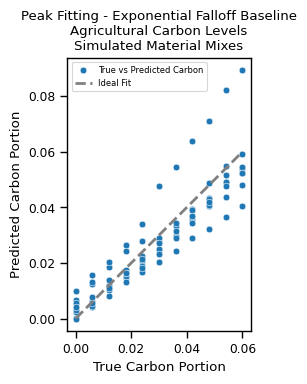

In [57]:
plt.figure(figsize=(4, 3.54330709))
sns.scatterplot(data=explode_vals_df, x='true_carbon', y='predicted_carbon', alpha=1, label='True vs Predicted Carbon')

plt.plot([0, .06], [0, .06], color='gray', linestyle='--', linewidth=2, label='Ideal Fit')
plt.gca().set_aspect('equal')
# plt.xlim(-0.01, 0.07)
# plt.ylim(-0.01, 0.07)
plt.legend(loc='upper left', fontsize=6)
plt.title('Peak Fitting - Exponential Falloff Baseline\nAgricultural Carbon Levels\nSimulated Material Mixes')
plt.xlabel('True Carbon Portion')
plt.ylabel('Predicted Carbon Portion')
plt.savefig(figure_folder + 'PF_Exponential_Falloff_Agricultural_Carbon_Levels.jpg', dpi=100, bbox_inches='tight')
plt.show()

In [58]:
_df.columns
# filter to if the column contains 'Feldspar' or '7x7x7'
feldspar_columns = _df.filter(like='Feldspar').columns
seven_by_seven_columns = _df.filter(like='7x7x7').columns
both_columns = feldspar_columns.intersection(seven_by_seven_columns)

In [59]:
min_carbon_example_fitting_cols = ['7x7x7_Feldspar_001021 baseline', '7x7x7_Feldspar_001021 peak','7x7x7_Feldspar_001021 true',]
max_carbon_example_fitting_cols = ['7x7x7_C_0600_Feldspar_Fill_003142 baseline', '7x7x7_C_0600_Feldspar_Fill_003142 peak', '7x7x7_C_0600_Feldspar_Fill_003142 true']

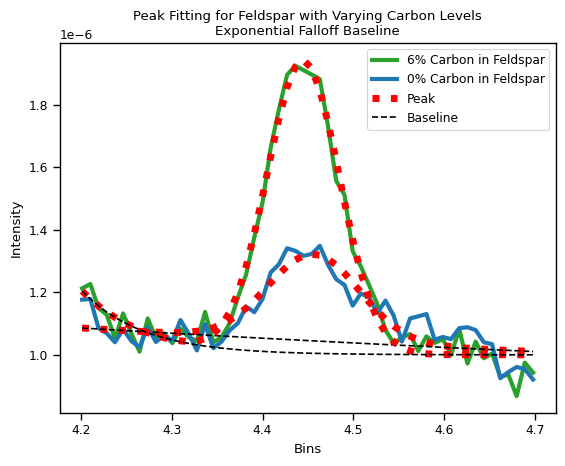

In [60]:
# plot every column in _df
plt.figure()
# for col in min_carbon_example_fitting_cols:
plt.plot(_df.bins, _df['7x7x7_C_0600_Feldspar_Fill_003142 true'], label='6% Carbon in Feldspar', color='tab:green', linewidth=3, alpha=1)
plt.plot(_df.bins, _df['7x7x7_Feldspar_001021 true'], label='0% Carbon in Feldspar', color='tab:blue', linewidth=3, alpha=1)

plt.plot(_df.bins, _df['7x7x7_Feldspar_001021 peak'], label='Peak', color='red', linestyle='dotted', alpha=1, linewidth=5)
plt.plot(_df.bins, _df['7x7x7_Feldspar_001021 baseline'], label='Baseline', color='black', linestyle='--', alpha=1)
plt.plot(_df.bins, _df['7x7x7_C_0600_Feldspar_Fill_003142 peak'], color='red', linestyle='dotted', alpha=1, linewidth=5)
plt.plot(_df.bins, _df['7x7x7_C_0600_Feldspar_Fill_003142 baseline'], color='black', linestyle='--', alpha=1)
plt.legend()
plt.xlabel('Bins')
plt.ylabel('Intensity')
plt.title('Peak Fitting for Feldspar with Varying Carbon Levels\nExponential Falloff Baseline')
plt.savefig(figure_folder+'peak_fitting_feldspar.png', dpi=50, bbox_inches='tight')
plt.show()

## Component Analysis

In [64]:
output.method.unique()

array(['Peak Fitting - linear Baseline',
       'Peak Fitting - Exponential Falloff Baseline',
       'Component Analysis - Average Training',
       'Component Analysis - Elemental Maps', 'SVD', 'Machine Learning'],
      dtype=object)

In [69]:
output['method group'].unique()

array(['Peak Fitting', 'Component Analysis', nan], dtype=object)

In [78]:
# _df = output[output['method']=='Peak Fitting - linear Baseline'].sort_values(by='mse')['c_lines_df'].iloc[0]
pfdf = output[output['method group']=='Component Analysis'].sort_values(by='mse', ascending=True)
print(tabulate(
    pfdf[['method', 'carbon level', 'datasets used', 'mse']], 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| method                                | carbon level   | datasets used        |         mse |
|---------------------------------------|----------------|----------------------|-------------|
| Component Analysis - Average Training | Agricultural   | Feldspar             | 7.48497e-07 |
| Component Analysis - Elemental Maps   | Agricultural   | Feldspar             | 7.91956e-07 |
| Component Analysis - Elemental Maps   | Agricultural   | Convolution Training | 0.000191402 |
| Component Analysis - Elemental Maps   | Agricultural   | Material Mixes       | 0.000209907 |
| Component Analysis - Average Training | Agricultural   | Convolution Training | 0.000295299 |
| Component Analysis - Average Training | Agricultural   | Material Mixes       | 0.000343431 |
| Component Analysis - Elemental Maps   | All            | Feldspar             | 0.00302435  |
| Component Analysis - Average Training | All            | Feldspar             | 0.00303636  |
| Component Analysis - Elemental Maps   

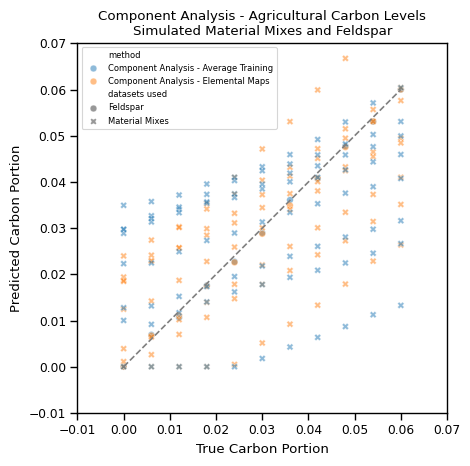

In [87]:

_df = pfdf
_df = _df[_df['carbon level'] == 'Agricultural']
_df = _df[_df['datasets used'].isin(['Material Mixes', 'Feldspar'])]
explode_test_vals_df = _df.explode([
    'true_carbon', 
    'predicted_carbon',
    ], ignore_index=True)
# explode_test_vals_df = explode_test_vals_df.sort_values(by='datasets used', ascending=False)

plt.figure()
sns.scatterplot(data=explode_test_vals_df, x='true_carbon', y='predicted_carbon', style='datasets used', hue='method', alpha=.5)

plt.plot([0, .06], [0, .06], color='gray', linestyle='--')
plt.gca().set_aspect('equal')
plt.xlim(-0.01, 0.07)
plt.ylim(-0.01, 0.07)

plt.legend(loc='upper left', fontsize=6)
plt.title('Component Analysis - Agricultural Carbon Levels\nSimulated Material Mixes and Feldspar')
plt.xlabel('True Carbon Portion')
plt.ylabel('Predicted Carbon Portion')
plt.savefig(figure_folder + 'CA_Agricultural_Carbon_Levels.jpg', dpi=100, bbox_inches='tight')
plt.show()

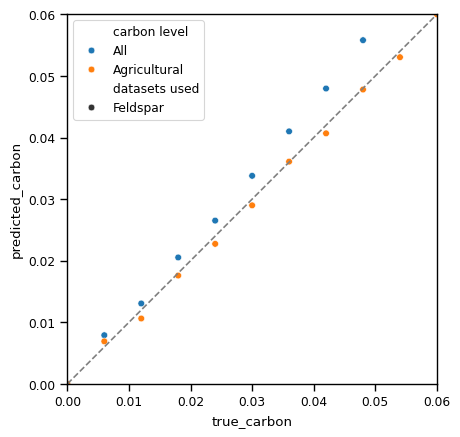

In [67]:
_df = output[output['datasets used']=='Feldspar']
_df = _df[_df['method']=='Component Analysis - Average Training']
explode_test_vals_df = _df.explode([
    'true_carbon', 
    'predicted_carbon',
    ], ignore_index=True)

plt.figure()
sns.scatterplot(data=explode_test_vals_df, x='true_carbon', y='predicted_carbon', style='datasets used', hue='carbon level', alpha=1)

plt.plot([0, .06], [0, .06], color='gray', linestyle='--')
plt.gca().set_aspect('equal')
plt.xlim(0, 0.06)
plt.ylim(0, 0.06)
plt.show()

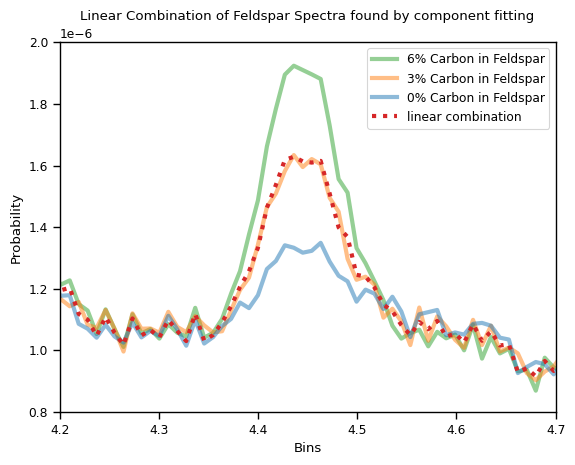

In [68]:
combined = (df['7x7x7_Feldspar_001021']*_df.iloc[0]['fitting_df'].loc['7x7x7_C_0300_Feldspar_Fill_003137']['average_min_carbon'])+(df['7x7x7_C_0600_Feldspar_Fill_003142']*_df.iloc[0]['fitting_df'].loc['7x7x7_C_0600_Feldspar_Fill_003142']['average_max_carbon'])

plt.figure()
plt.plot(bins, df['7x7x7_C_0600_Feldspar_Fill_003142'], label='6% Carbon in Feldspar', color='tab:green', linewidth=3, alpha=0.5)
plt.plot(bins, df['7x7x7_C_0300_Feldspar_Fill_003137'], label='3% Carbon in Feldspar', color='tab:orange', linewidth=3, alpha=0.5)
plt.plot(bins, df['7x7x7_Feldspar_001021'], label='0% Carbon in Feldspar', color='tab:blue', linewidth=3, alpha=0.5)
plt.plot(bins, combined, label='linear combination', color='tab:red', linewidth=3, linestyle='dotted')
plt.xlabel('Bins')
plt.ylabel('Probability')
plt.title('Linear Combination of Feldspar Spectra found by component fitting')
plt.legend()
plt.xlim(4.2, 4.7)
plt.ylim(8e-7, 2e-6)
plt.savefig(figure_folder+'linear_combination_feldspar.png', dpi=50, bbox_inches='tight')
plt.show()

## Singular Value Decomposition (SVD)

In [45]:
pfdf = output[output['method']=='SVD'].sort_values(by='mse', ascending=True)
print(tabulate(
    pfdf[['carbon level', 'datasets used', 'mse']], 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| carbon level   | datasets used        |         mse |
|----------------|----------------------|-------------|
| Agricultural   | Convolution Training | 0.000293279 |
| Agricultural   | Material Mixes       | 0.000427226 |
| Agricultural   | Feldspar             | 0.0021363   |
| All            | Convolution Training | 0.0106654   |
| All            | Feldspar             | 0.0115547   |
| All            | Material Mixes       | 0.0264083   |


In [46]:
example_decomposed_df = output[output.method == 'SVD'].iloc[0]['decomposed_df'].T

In [47]:
example_decomposed_df

,7x7x7_Silica_001014,7x7x7_Kaolinite_001015,7x7x7_Smectite_001016,7x7x7_Montmorillonite_001017,7x7x7_Quartz_001018,7x7x7_Chlorite_001019,7x7x7_Mica_001020,7x7x7_Feldspar_001021,7x7x7_Coconut_001022,7x7x7_C_0060_Silica_Fill_003000,...,7x7x7_C_0600_Feldspar_Fill_003142,7x7x7_C_1000_Feldspar_Fill_003143,7x7x7_C_2000_Feldspar_Fill_003144,7x7x7_C_3000_Feldspar_Fill_003145,7x7x7_C_4000_Feldspar_Fill_003146,7x7x7_C_5000_Feldspar_Fill_003147,7x7x7_C_6000_Feldspar_Fill_003148,7x7x7_C_7000_Feldspar_Fill_003149,7x7x7_C_8000_Feldspar_Fill_003150,7x7x7_C_9000_Feldspar_Fill_003151
2.00574,0.000000,0.000000,1.500979e-06,0.000000,0.000000,0.000000,0.000000,0.000000,0.000002,0.000000,...,0.000000,0.000000e+00,0.000003,0.000000,0.000000e+00,0.000000,0.000003,3.282241e-06,0.000000,0.000000e+00
2.01478,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
2.02381,0.000000,0.000004,0.000000e+00,0.000005,0.000000,0.000006,0.000008,0.000002,0.000000,0.000000,...,0.000001,0.000000e+00,0.000000,0.000001,9.649559e-07,0.000001,0.000000,0.000000e+00,0.000000,0.000000e+00
2.03285,0.000013,0.000008,1.179760e-05,0.000009,0.000009,0.000004,0.000004,0.000013,0.000000,0.000012,...,0.000013,1.320445e-05,0.000006,0.000012,1.103821e-05,0.000010,0.000000,0.000000e+00,0.000005,6.187261e-06
2.04188,0.000002,0.000000,2.476202e-07,0.000000,0.000006,0.000000,0.000000,0.000000,0.000002,0.000003,...,0.000000,9.043812e-07,0.000006,0.000000,0.000000e+00,0.000000,0.000007,3.974903e-07,0.000003,5.367533e-07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8.39336,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
8.40240,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
8.41143,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00
8.42047,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000e+00,0.000000,0.000000e+00


In [48]:
_df = _df[_df['method']=='Component Analysis - Average Training']

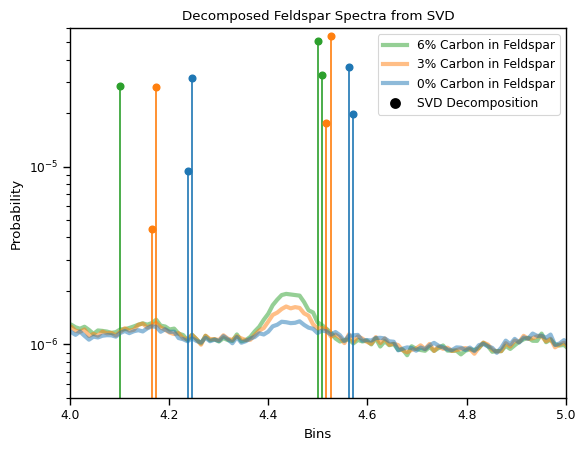

In [49]:
plt.figure()
plt.plot(bins, df['7x7x7_C_0600_Feldspar_Fill_003142'], label='6% Carbon in Feldspar', color='tab:green', linewidth=3, alpha=0.5)
plt.stem(example_decomposed_df.index, example_decomposed_df['7x7x7_C_0600_Feldspar_Fill_003142'],'tab:green')
plt.plot(bins, df['7x7x7_C_0300_Feldspar_Fill_003137'], label='3% Carbon in Feldspar', color='tab:orange', linewidth=3, alpha=0.5)
plt.stem(example_decomposed_df.index, example_decomposed_df['7x7x7_C_0300_Feldspar_Fill_003137'], 'tab:orange')
plt.plot(bins, df['7x7x7_Feldspar_001021'], label='0% Carbon in Feldspar', color='tab:blue', linewidth=3, alpha=0.5)
plt.stem(example_decomposed_df.index, example_decomposed_df['7x7x7_Feldspar_001021'], 'tab:blue')
# make empty lines for legend
# plt.plot([], [], label='6% Carbon in Feldspar', color='tab:green', linewidth=3, alpha=0.5)
# plt.plot([], [], label='3% Carbon in Feldspar', color='tab:orange', linewidth=3, alpha=0.5)
# plt.plot([], [], label='0% Carbon in Feldspar', color='tab:blue', linewidth=3, alpha=0.5)
plt.scatter([], [], label='SVD Decomposition', color='black', linewidth=3, alpha=1)
plt.xlabel('Bins')
plt.ylabel('Probability')
plt.title('Decomposed Feldspar Spectra from SVD')
plt.legend()
plt.yscale('log')
# plt.xlim(4.2, 4.7)
plt.xlim(4, 5)
plt.ylim(5e-7, 6e-5)
plt.savefig(figure_folder+'decomposed_feldspar_svd.jpg', dpi=50, bbox_inches='tight')
# save as eps
# plt.savefig(figure_folder+'decomposed_feldspar_svd.eps', dpi=50, bbox_inches='tight')
plt.show()

## Deep Learning

In [50]:
output.method.unique()

array(['Peak Fitting - linear Baseline',
       'Peak Fitting - Exponential Falloff Baseline',
       'Component Analysis - Average Training',
       'Component Analysis - Elemental Maps', 'SVD', 'Machine Learning'],
      dtype=object)

In [51]:
pfdf = output[output['method']=='Machine Learning'].sort_values(by='mse', ascending=True)
print(tabulate(
    pfdf[['carbon level', 'datasets used', 'mse']], 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| carbon level   | datasets used        |         mse |
|----------------|----------------------|-------------|
| Agricultural   | Material Mixes       | 0.000357459 |
| Agricultural   | Convolution Training | 0.000360138 |
| Agricultural   | Feldspar             | 0.000764463 |
| All            | Convolution Training | 0.0893365   |
| All            | Material Mixes       | 0.0971477   |
| All            | Feldspar             | 0.416227    |


## All

In [52]:
pfdf = output.sort_values(by='mse', ascending=True)
print(tabulate(
    pfdf[['method', 'carbon level', 'datasets used', 'mse']], 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| method                                      | carbon level   | datasets used        |         mse |
|---------------------------------------------|----------------|----------------------|-------------|
| Component Analysis - Average Training       | Agricultural   | Feldspar             | 7.48497e-07 |
| Component Analysis - Elemental Maps         | Agricultural   | Feldspar             | 7.91956e-07 |
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Feldspar             | 3.43383e-05 |
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Convolution Training | 7.25777e-05 |
| Peak Fitting - Exponential Falloff Baseline | Agricultural   | Material Mixes       | 7.65971e-05 |
| Component Analysis - Elemental Maps         | Agricultural   | Convolution Training | 0.000191402 |
| Component Analysis - Elemental Maps         | Agricultural   | Material Mixes       | 0.000209907 |
| SVD                                         | Agricultural   | Convolution Train

In [53]:
# make this table:
# |Carbon Level | Component Fitting MSE | Peak Fitting MSE | SVD MSE | Deep Learning MSE |
# |-------------|-----------------------|------------------|---------|-------------------|
# | Low         | 0.0x                  | 0.0x             | 0.0x    | 0.0x              |
# | High        | 0.0x                  | 0.0x             | 0.0x    | 0.0x              |
carbon_levels = output['carbon level'].unique()
methods = output['method'].unique()
results_table = pd.DataFrame(columns=['Carbon Level'] + list(methods))

for level in carbon_levels:
    row = {'Carbon Level': level}
    for method in methods:
        mse = output[(output['carbon level'] == level) & (output['method'] == method)]['mse']
        if not mse.empty:
            row[method] = mse.values[0]
        else:
            row[method] = 'N/A'
    results_table = pd.concat([results_table, pd.DataFrame([row])], ignore_index=True)
print(tabulate(
    results_table, 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| Carbon Level   |   Peak Fitting - linear Baseline |   Peak Fitting - Exponential Falloff Baseline |   Component Analysis - Average Training |   Component Analysis - Elemental Maps |         SVD |   Machine Learning |
|----------------|----------------------------------|-----------------------------------------------|-----------------------------------------|---------------------------------------|-------------|--------------------|
| All            |                      0.0347815   |                                   0.014231    |                             0.0191523   |                           0.0192477   | 0.0264083   |        0.0971477   |
| Agricultural   |                      0.000351535 |                                   7.65971e-05 |                             0.000343431 |                           0.000209907 | 0.000427226 |        0.000357459 |


/tmp/ipykernel_1286807/74297830.py:18: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_table = pd.concat([results_table, pd.DataFrame([row])], ignore_index=True)


In [54]:
# do the same for the datasets used
datasets_used = output['datasets used'].unique()
results_table_datasets = pd.DataFrame(columns=['Datasets Used'] + list(methods))
for dataset in datasets_used:
    row = {'Datasets Used': dataset}
    for method in methods:
        mse = output[(output['datasets used'] == dataset) & (output['method'] == method)]['mse']
        if not mse.empty:
            row[method] = mse.values[0]
        else:
            row[method] = 'N/A'
    results_table_datasets = pd.concat([results_table_datasets, pd.DataFrame([row])], ignore_index=True)
print(tabulate(
    results_table_datasets, 
    headers='keys',
    showindex=False,
    tablefmt='github',
        ))

| Datasets Used        |   Peak Fitting - linear Baseline |   Peak Fitting - Exponential Falloff Baseline |   Component Analysis - Average Training |   Component Analysis - Elemental Maps |       SVD |   Machine Learning |
|----------------------|----------------------------------|-----------------------------------------------|-----------------------------------------|---------------------------------------|-----------|--------------------|
| Material Mixes       |                       0.0347815  |                                    0.014231   |                              0.0191523  |                            0.0192477  | 0.0264083 |          0.0971477 |
| Convolution Training |                       0.00585135 |                                    0.00331505 |                              0.00385569 |                            0.0037997  | 0.0106654 |          0.0893365 |
| Feldspar             |                       0.0187823  |                                    0.00194593 | 

/tmp/ipykernel_1286807/2050904581.py:12: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_table_datasets = pd.concat([results_table_datasets, pd.DataFrame([row])], ignore_index=True)
